# MLToolkit Example
Create Date: July 1, 2018; Last Update: July 01, 2019. 
Apache License, Version 2.0 (http://www.apache.org/licenses/LICENSE-2.0)
<hr>


# Adult Census Income
## Predict whether income exceeds $50K/yr based on census data.
Source: https://www.kaggle.com/uciml/adult-census-income/home

About this file
Attributes:


<ul>
<li>[age]: continuous</li>
<li>[workclass]: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked</li>
<li>[fnlwgt]: continuous. final weight. In other words, this is the number of people the census believes the entry represents.</li>
<li>[education]: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool</li>
<li>[education-num]: The highest level of education achieved in numerical form. continuous</li>
<li>[marital-status]: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse</li>
<li>[occupation]: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces</li>
<li>[relationship]: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried</li>
<li>[race]: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black</li>
<li>[sex]: Female, Male</li>
<li>[capital-gain]: continuous</li>
<li>[capital-loss]: continuous</li>
<li>[hours-per-week]: continuous</li>
<li>[native-country]: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands</li>
<li>[income]: RESPONSE (">50K", "<=50K") </li>
</ul>

# 1. Load Python libraries

In [1]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import calibration_curve
from sklearn.metrics import roc_curve, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import MLToolkit as mltk
%matplotlib inline

MLToolkit==0.1.2


# 2. Load Dataset

In [2]:
FileName = 'incomedata.csv'
Data = pd.read_csv(FileName)

### Add ID column

In [3]:
Data = mltk.add_identity_column(Data, id_label='ID', start=1, increment=1)
Data.head()

,ID,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,1,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,2,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,3,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,4,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,5,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


# 3. Explore Dataset
### Fields, Data Types, Bastic Statistics

In [4]:
DataStats = mltk.data_description(Data)
DataStats

,count,unique,top,freq,mean,std,min,10%,25%,50%,75%,90%,max,dtypes
ID,32561,None,None,None,16281,9399.7,1,3257,8141,16281,24421,29305,32561,int64
age,32561,None,None,None,38.582,13.64,17,22,28,37,48,58,90,int64
workclass,32561,9,Private,22696,None,None,None,None,None,None,None,None,None,object
fnlwgt,32561,None,None,None,1.8978e+05,1.0555e+05,12285,65716,1.1783e+05,1.7836e+05,2.3705e+05,3.2905e+05,1.4847e+06,int64
education,32561,16,HS-grad,10501,None,None,None,None,None,None,None,None,None,object
education-num,32561,None,None,None,10.081,2.5727,1,7,9,10,12,13,16,int64
marital-status,32561,7,Married-civ-spouse,14976,None,None,None,None,None,None,None,None,None,object
occupation,32561,15,Prof-specialty,4140,None,None,None,None,None,None,None,None,None,object
relationship,32561,6,Husband,13193,None,None,None,None,None,None,None,None,None,object
race,32561,5,White,27816,None,None,None,None,None,None,None,None,None,object


# 4. Creating Feature Variables

## Identify Response variable/Class Variable (y)

In [5]:
class_variable = 'HighIncome'
response_raw = 'income'
Data[class_variable]=np.where(Data[response_raw]=='>50K',1,0)

## Inspect Continious/Numerical Variables

               counts
age                  
1_[17,24.3]      5570
2_[24.3,31.6]    5890
3_[31.6,38.9]    6048
4_[38.9,46.2]    6163
5_[46.2,53.5]    3967
6_[53.5,60.8]    2591
7_[60.8,68.1]    1595
8_[68.1,75.4]     496
9_[75.4,82.7]     174
10_[82.7,90]       67
TOTAL           32561


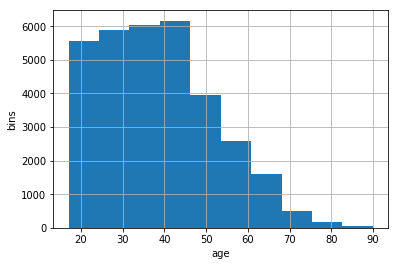

In [6]:
table = mltk.histogram(Data, 'age', n_bins=10, orientation='vertical')
print(table)

                counts
hours-per-week        
1_[1,10.8]         736
2_[10.8,20.6]     2192
3_[20.6,30.4]     2317
4_[30.4,40.2]    17735
5_[40.2,50]       3119
6_[50,59.8]       3877
7_[59.8,69.6]     1796
8_[69.6,79.4]      448
9_[79.4,89.2]      202
10_[89.2,99]       139
TOTAL            32561


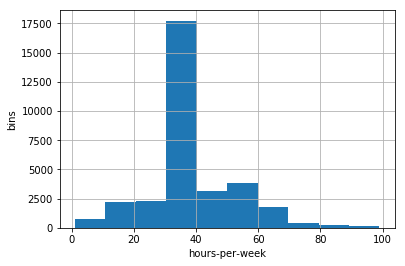

In [7]:
import matplotlib.pyplot as plt

table = mltk.histogram(Data, 'hours-per-week', n_bins=10, orientation='vertical')
print(table)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002225FFA7630>,
      dtype=object)

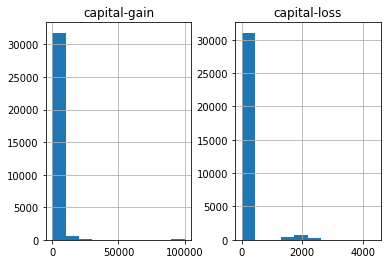

In [8]:
Data[['capital-gain','capital-loss']].hist()

## Inspect Categorical Variables

In [9]:
Data.groupby(by=['education', 'education-num'])['ID'].count()

education     education-num
10th          6                  933
11th          7                 1175
12th          8                  433
1st-4th       2                  168
5th-6th       3                  333
7th-8th       4                  646
9th           5                  514
Assoc-acdm    12                1067
Assoc-voc     11                1382
Bachelors     13                5355
Doctorate     16                 413
HS-grad       9                10501
Masters       14                1723
Preschool     1                   51
Prof-school   15                 576
Some-college  10                7291
Name: ID, dtype: int64

In [10]:
categorical_variables = ['workclass', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'native-country', 'income']

In [11]:
print(mltk.category_lists(Data, categorical_variables))

workclass:('?', 'Private', 'State-gov', 'Federal-gov', 'Self-emp-not-inc', 'Self-emp-inc', 'Local-gov', 'Without-pay', 'Never-worked')

education:('HS-grad', 'Some-college', '7th-8th', '10th', 'Doctorate', 'Prof-school', 'Bachelors', 'Masters', '11th', 'Assoc-acdm', 'Assoc-voc', '1st-4th', '5th-6th', '12th', '9th', 'Preschool')

education-num:(9, 10, 4, 6, 16, 15, 13, 14, 7, 12, 11, 2, 3, 8, 5, 1)

marital-status:('Widowed', 'Divorced', 'Separated', 'Never-married', 'Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse')

occupation:('?', 'Exec-managerial', 'Machine-op-inspct', 'Prof-specialty', 'Other-service', 'Adm-clerical', 'Craft-repair', 'Transport-moving', 'Handlers-cleaners', 'Sales', 'Farming-fishing', 'Tech-support', 'Protective-serv', 'Armed-Forces', 'Priv-house-serv')

relationship:('Not-in-family', 'Unmarried', 'Own-child', 'Other-relative', 'Husband', 'Wife')

race:('White', 'Black', 'Asian-Pac-Islander', 'Other', 'Amer-Indian-Eskimo')

sex:('Female', 'Male')


                  Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
workclass                                                                              
?                   1836         191          5.63865            2.43591       10.40305
Federal-gov          960         371          2.94831            4.73154       38.64583
Local-gov           2093         617          6.42794            7.86889       29.47922
Never-worked           7           0          0.02150            0.00000        0.00000
Private            22696        4963         69.70302           63.29550       21.86729
Self-emp-inc        1116         622          3.42741            7.93266       55.73477
Self-emp-not-inc    2541         724          7.80381            9.23352       28.49272
State-gov           1298         353          3.98636            4.50198       27.19569
Without-pay           14           0          0.04300            0.00000        0.00000
TOTAL              32561        

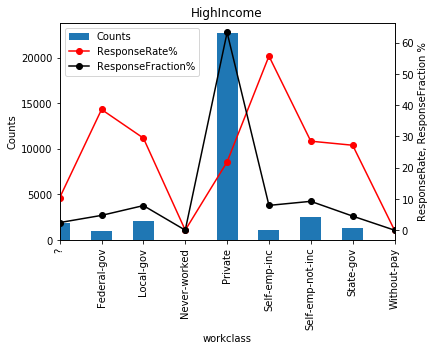

              Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
education                                                                          
10th             933          62          2.86539            0.79072        6.64523
11th            1175          60          3.60861            0.76521        5.10638
12th             433          33          1.32981            0.42086        7.62125
1st-4th          168           6          0.51595            0.07652        3.57143
5th-6th          333          16          1.02270            0.20406        4.80480
7th-8th          646          40          1.98397            0.51014        6.19195
9th              514          27          1.57858            0.34434        5.25292
Assoc-acdm      1067         265          3.27693            3.37967       24.83599
Assoc-voc       1382         361          4.24434            4.60400       26.12156
Bachelors       5355        2221         16.44606           28.32547       4

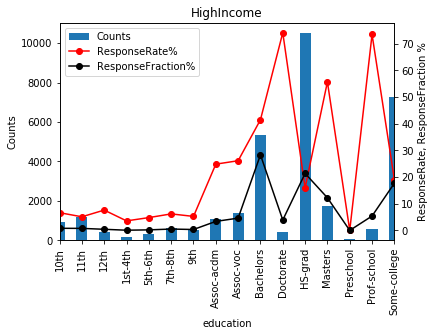

               Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
education-num                                                                       
1                  51           0          0.15663            0.00000        0.00000
2                 168           6          0.51595            0.07652        3.57143
3                 333          16          1.02270            0.20406        4.80480
4                 646          40          1.98397            0.51014        6.19195
5                 514          27          1.57858            0.34434        5.25292
6                 933          62          2.86539            0.79072        6.64523
7                1175          60          3.60861            0.76521        5.10638
8                 433          33          1.32981            0.42086        7.62125
9               10501        1675         32.25024           21.36207       15.95086
10               7291        1387         22.39182           17.6

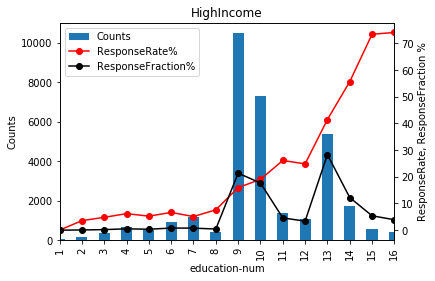

                       Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
marital-status                                                                              
Divorced                 4443         463         13.64516            5.90486       10.42089
Married-AF-spouse          23          10          0.07064            0.12753       43.47826
Married-civ-spouse      14976        6692         45.99367           85.34626       44.68483
Married-spouse-absent     418          34          1.28374            0.43362        8.13397
Never-married           10683         491         32.80919            6.26196        4.59609
Separated                1025          66          3.14794            0.84173        6.43902
Widowed                   993          85          3.04966            1.08405        8.55992
TOTAL                   32561        7841        100.00000          100.00000            NaN


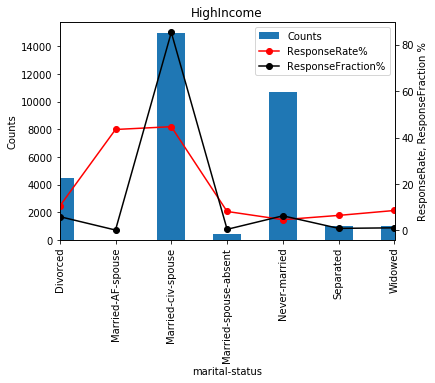

                   Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
occupation                                                                              
?                    1843         191          5.66015            2.43591       10.36354
Adm-clerical         3770         507         11.57827            6.46601       13.44828
Armed-Forces            9           1          0.02764            0.01275       11.11111
Craft-repair         4099         929         12.58868           11.84798       22.66406
Exec-managerial      4066        1968         12.48733           25.09884       48.40138
Farming-fishing       994         115          3.05273            1.46665       11.56942
Handlers-cleaners    1370          86          4.20749            1.09680        6.27737
Machine-op-inspct    2002         250          6.14846            3.18837       12.48751
Other-service        3295         137         10.11947            1.74723        4.15781
Priv-house-serv      

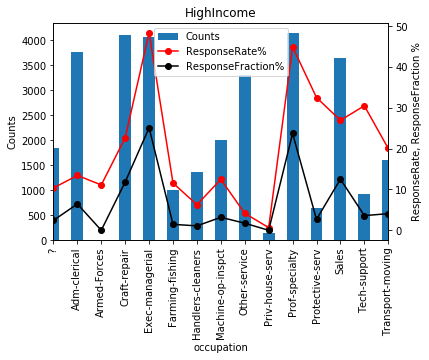

                Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
relationship                                                                         
Husband          13193        5918         40.51780           75.47507       44.85712
Not-in-family     8305         856         25.50597           10.91697       10.30704
Other-relative     981          37          3.01281            0.47188        3.77166
Own-child         5068          67         15.56463            0.85448        1.32202
Unmarried         3446         218         10.58321            2.78026        6.32618
Wife              1568         745          4.81558            9.50134       47.51276
TOTAL            32561        7841        100.00000          100.00000            NaN


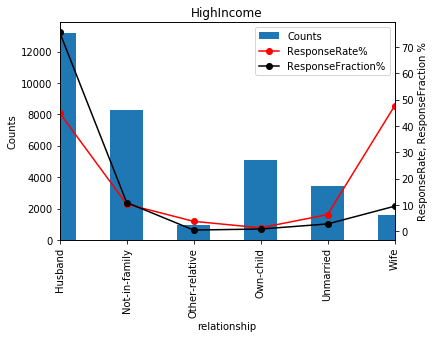

                    Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
race                                                                                     
Amer-Indian-Eskimo     311          36          0.95513            0.45913       11.57556
Asian-Pac-Islander    1039         276          3.19093            3.51996       26.56400
Black                 3124         387          9.59430            4.93559       12.38796
Other                  271          25          0.83228            0.31884        9.22509
White                27816        7117         85.42735           90.76648       25.58599
TOTAL                32561        7841        100.00000          100.00000            NaN


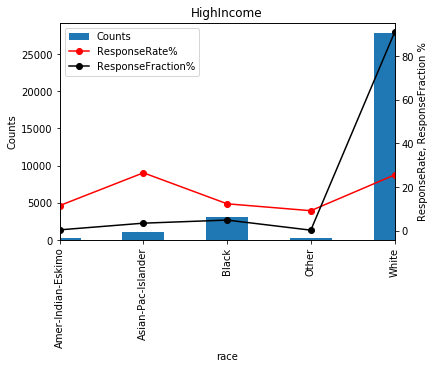

        Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
sex                                                                          
Female   10771        1179         33.07945           15.03635       10.94606
Male     21790        6662         66.92055           84.96365       30.57366
TOTAL    32561        7841        100.00000          100.00000            NaN


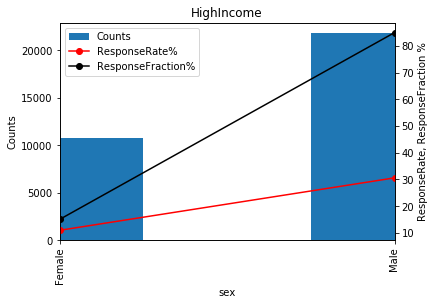

                            Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
native-country                                                                                   
?                              583         146          1.79049            1.86201       25.04288
Cambodia                        19           7          0.05835            0.08927       36.84211
Canada                         121          39          0.37161            0.49739       32.23140
China                           75          20          0.23034            0.25507       26.66667
Columbia                        59           2          0.18120            0.02551        3.38983
Cuba                            95          25          0.29176            0.31884       26.31579
Dominican-Republic              70           2          0.21498            0.02551        2.85714
Ecuador                         28           4          0.08599            0.05101       14.28571
El-Salvador         

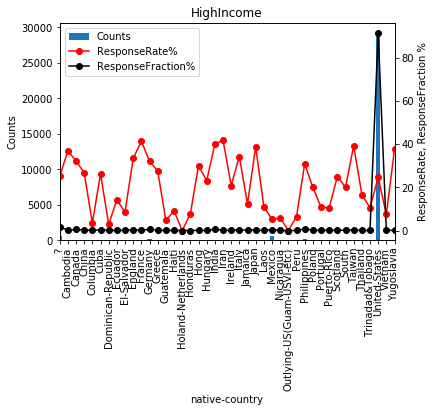

        Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
income                                                                       
<=50K    24720           0         75.91904                0.0            0.0
>50K      7841        7841         24.08096              100.0          100.0
TOTAL    32561        7841        100.00000              100.0            NaN


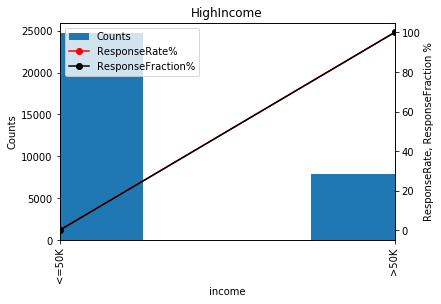

In [12]:
mltk.plot_variable_responses(Data, variables=categorical_variables, class_variable='HighIncome')

## Create Categorical Variables from continious variables

In [13]:
Data['CapitalGainPositive'] = np.where(Data['capital-gain']>0,1,0) 
Data['CapitalLossPositive'] = np.where(Data['capital-loss']>0,1,0) 

            Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
ageGRP                                                                           
1_[0,20]      2410           2          7.40149            0.02551        0.08299
2_[20,30]     8162         680         25.06680            8.67236        8.33129
3_[30,40]     8546        2406         26.24612           30.68486       28.15352
4_[40,50]     6983        2655         21.44590           33.86048       38.02091
5_[50,60]     4128        1547         12.67774           19.72963       37.47578
6_[60,INF)    2332         551          7.16194            7.02716       23.62779
TOTAL        32561        7841        100.00000          100.00000            NaN


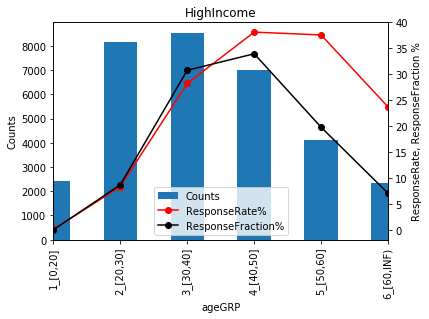

In [14]:
variable='age'
AgeEdgeLabels = ['0', '20', '30', '40', '50', '60', 'INF']
mltk.numeric_to_category(DataFrame=Data, variable=variable, str_labels=AgeEdgeLabels, left_inclusive=True, print_output=False)
variable='ageGRP'
mltk.plot_variable_response(DataFrame=Data, variable=variable, class_variable=class_variable)

                  Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
education-numGRP                                                                       
1_[1,4]             1147          62          3.52815            0.79072        5.40541
2_[4,6]             1447          89          4.45094            1.13506        6.15066
3_[6,8]             1608          93          4.94617            1.18607        5.78358
4_[8,10]           17792        3062         54.72778           39.05114       17.20998
5_[10,13]           7804        2847         24.00492           36.30914       36.48129
6_[13,16)           2712        1688          8.34205           21.52787       62.24189
TOTAL              32510        7841        100.00000          100.00000            NaN


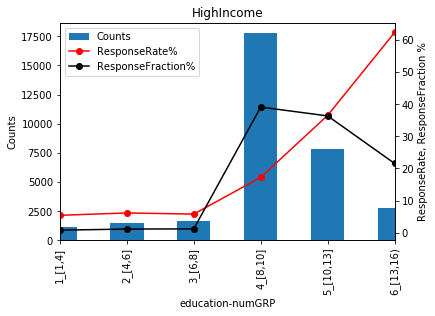

In [15]:
variable='education-num'
EduNumEdgeLabels=['1', '4', '6', '8', '10', '13', '16']
mltk.numeric_to_category(DataFrame=Data, variable=variable, str_labels=EduNumEdgeLabels, left_inclusive=True, print_output=False)
variable='education-numGRP'
mltk.plot_variable_response(DataFrame=Data, variable=variable, class_variable=class_variable)

                   Counts  HighIncome  CountsFraction%  ResponseFraction%  ResponseRate%
hours-per-weekGRP                                                                       
1_[0,20]             2928         195          8.99235            2.48693        6.65984
2_[20,40]           20052        3790         61.58288           48.33567       18.90086
3_[40,50]            5938        2352         18.23654           29.99617       39.60930
4_[50,60]            2533        1100          7.77925           14.02882       43.42677
5_[60,INF)           1110         404          3.40899            5.15240       36.39640
TOTAL               32561        7841        100.00000          100.00000            NaN


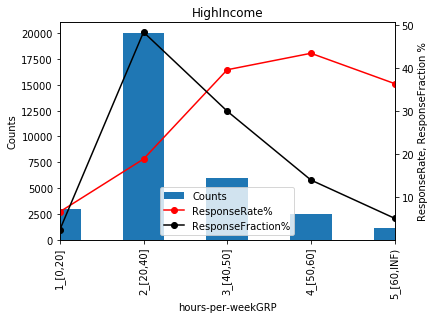

In [16]:
variable='hours-per-week'
HoursPerWeekEdgeLabels = ['0', '20', '40', '50', '60', 'INF']
mltk.numeric_to_category(DataFrame=Data, variable=variable, str_labels=HoursPerWeekEdgeLabels, left_inclusive=True, print_output=False)
variable='hours-per-weekGRP'
mltk.plot_variable_response(DataFrame=Data, variable=variable, class_variable=class_variable)

In [17]:
Data.head()

,ID,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income,HighIncome,CapitalGainPositive,CapitalLossPositive,ageGRP,education-numGRP,hours-per-weekGRP
0,1,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K,0,0,1,"6_[60,INF)","4_[8,10]","2_[20,40]"
1,2,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K,0,0,1,"6_[60,INF)","4_[8,10]","1_[0,20]"
2,3,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K,0,0,1,"6_[60,INF)","4_[8,10]","2_[20,40]"
3,4,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K,0,0,1,"5_[50,60]","1_[1,4]","2_[20,40]"
4,5,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K,0,0,1,"4_[40,50]","4_[8,10]","2_[20,40]"


# 5. Create Modeling dataset

## Feature/Predictor variables (X) and Response variable (y)

In [18]:
Data.columns.values

array(['ID', 'age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income', 'HighIncome', 'CapitalGainPositive',
       'CapitalLossPositive', 'ageGRP', 'education-numGRP',
       'hours-per-weekGRP'], dtype=object)

In [19]:
CategoryVariables = ['workclass', 'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'native-country', 'ageGRP', 'education-numGRP', 'hours-per-weekGRP'] 
#'ID', 'age', 'fnlwgt', 'income', 'HighIncome', 'education', 'education-num', 'hours-per-week', 'capital-gain', 'capital-loss', 
BinaryVariables = ['CapitalGainPositive', 'CapitalLossPositive']
Target = 'HighIncome'
IdentifierColumns = ['ID']
Data[BinaryVariables+CategoryVariables+[Target]].head()

,CapitalGainPositive,CapitalLossPositive,workclass,marital-status,occupation,relationship,race,sex,native-country,ageGRP,education-numGRP,hours-per-weekGRP,HighIncome
0,0,1,?,Widowed,?,Not-in-family,White,Female,United-States,"6_[60,INF)","4_[8,10]","2_[20,40]",0
1,0,1,Private,Widowed,Exec-managerial,Not-in-family,White,Female,United-States,"6_[60,INF)","4_[8,10]","1_[0,20]",0
2,0,1,?,Widowed,?,Unmarried,Black,Female,United-States,"6_[60,INF)","4_[8,10]","2_[20,40]",0
3,0,1,Private,Divorced,Machine-op-inspct,Unmarried,White,Female,United-States,"5_[50,60]","1_[1,4]","2_[20,40]",0
4,0,1,Private,Separated,Prof-specialty,Own-child,White,Female,United-States,"4_[40,50]","4_[8,10]","2_[20,40]",0


## Create One Hot Encoded Variables

In [20]:
Data, FeatureVariables, Target = mltk.to_one_hot_encode(Data, category_variables=CategoryVariables, binary_variables=BinaryVariables, target_variable=Target)
Data[IdentifierColumns+FeatureVariables+[Target]].sample(5)

,ID,CapitalGainPositive,CapitalLossPositive,workclass_?,workclass_Federal-gov,workclass_Local-gov,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,marital-status_Divorced,marital-status_Married-AF-spouse,marital-status_Married-civ-spouse,marital-status_Married-spouse-absent,marital-status_Never-married,marital-status_Separated,marital-status_Widowed,occupation_?,occupation_Adm-clerical,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Amer-Indian-Eskimo,race_Asian-Pac-Islander,race_Black,race_Other,race_White,sex_Female,sex_Male,native-country_?,native-country_Cambodia,native-country_Canada,native-country_China,native-country_Columbia,native-country_Cuba,native-country_Dominican-Republic,native-country_Ecuador,native-country_El-Salvador,native-country_England,native-country_France,native-country_Germany,native-country_Greece,native-country_Guatemala,native-country_Haiti,native-country_Holand-Netherlands,native-country_Honduras,native-country_Hong,native-country_Hungary,native-country_India,native-country_Iran,native-country_Ireland,native-country_Italy,native-country_Jamaica,native-country_Japan,native-country_Laos,native-country_Mexico,native-country_Nicaragua,native-country_Outlying-US(Guam-USVI-etc),native-country_Peru,native-country_Philippines,native-country_Poland,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia,"ageGRP_1_[0,20]","ageGRP_2_[20,30]","ageGRP_3_[30,40]","ageGRP_4_[40,50]","ageGRP_5_[50,60]","ageGRP_6_[60,INF)","education-numGRP_1_[1,4]","education-numGRP_2_[4,6]","education-numGRP_3_[6,8]","education-numGRP_4_[8,10]","education-numGRP_5_[10,13]","education-numGRP_6_[13,16)","hours-per-weekGRP_1_[0,20]","hours-per-weekGRP_2_[20,40]","hours-per-weekGRP_3_[40,50]","hours-per-weekGRP_4_[50,60]","hours-per-weekGRP_5_[60,INF)",HighIncome
8609,8610,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
31535,31536,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
16161,16162,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
30364,30365,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1
17595,17596,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1


## Analyze Correlation 

In [21]:
correlation=mltk.correlation_matrix(Data, FeatureVariables+[Target], target_variable=class_variable, method='pearson', return_type='list', show_plot=False)
correlation.style.background_gradient(cmap='coolwarm').set_precision(3)

## Split data to train and test datasets

In [22]:
TrainDataset, ValidateDataset, TestDataset = mltk.train_validate_test_split(Data, ratios=(0.6,0.2,0.2))

Train Samples: 19536 [60.0%]
Validate Samples: 6512 [20.0%]
Test Samples: 6513 [20.0%]


# 6. Run classifier algorithms

In [23]:
TrainDataset[FeatureVariables].columns#.values

Index(['CapitalGainPositive', 'CapitalLossPositive', 'workclass_?',
       'workclass_Federal-gov', 'workclass_Local-gov',
       'workclass_Never-worked', 'workclass_Private', 'workclass_Self-emp-inc',
       'workclass_Self-emp-not-inc', 'workclass_State-gov',
       ...
       'education-numGRP_2_[4,6]', 'education-numGRP_3_[6,8]',
       'education-numGRP_4_[8,10]', 'education-numGRP_5_[10,13]',
       'education-numGRP_6_[13,16)', 'hours-per-weekGRP_1_[0,20]',
       'hours-per-weekGRP_2_[20,40]', 'hours-per-weekGRP_3_[40,50]',
       'hours-per-weekGRP_4_[50,60]', 'hours-per-weekGRP_5_[60,INF)'],
      dtype='object', length=105)

In [24]:
model_variables =[
##'CapitalGainPositive', 
##'CapitalLossPositive', 
##'workclass_?',
'workclass_Federal-gov', 
'workclass_Local-gov',
'workclass_Never-worked', 
'workclass_Private',
'workclass_Self-emp-inc', 
'workclass_Self-emp-not-inc',
'workclass_State-gov', 
##'workclass_Without-pay',
'marital-status_Divorced', 
'marital-status_Married-AF-spouse',
'marital-status_Married-civ-spouse',
'marital-status_Married-spouse-absent',
'marital-status_Never-married', 
'marital-status_Separated',
##'marital-status_Widowed', 
##'occupation_?',
'occupation_Adm-clerical', 
'occupation_Armed-Forces',
'occupation_Craft-repair', 
'occupation_Exec-managerial',
'occupation_Farming-fishing', 
'occupation_Handlers-cleaners',
'occupation_Machine-op-inspct', 
'occupation_Other-service',
'occupation_Priv-house-serv', 
'occupation_Prof-specialty',
'occupation_Protective-serv', 
'occupation_Sales',
'occupation_Tech-support', 
##'occupation_Transport-moving',
'relationship_Husband', 
'relationship_Not-in-family',
'relationship_Other-relative', 
'relationship_Own-child',
'relationship_Unmarried', 
##'relationship_Wife',
'race_Amer-Indian-Eskimo', 
'race_Asian-Pac-Islander', 
'race_Black',
'race_Other', 
##'race_White', 
'sex_Female', 
##'sex_Male',
##'native-country_?', 
#'native-country_Cambodia',
#'native-country_Canada', 
#'native-country_China',
#'native-country_Columbia', 
#'native-country_Cuba',
#'native-country_Dominican-Republic', 
#'native-country_Ecuador',
#'native-country_El-Salvador', 
#'native-country_England',
#'native-country_France', 
#'native-country_Germany',
#'native-country_Greece', 
#'native-country_Guatemala',
#'native-country_Haiti', 
#'native-country_Holand-Netherlands',
#'native-country_Honduras', 
#'native-country_Hong',
#'native-country_Hungary', 
#'native-country_India',
#'native-country_Iran', 
#'native-country_Ireland',
#'native-country_Italy', 
#'native-country_Jamaica',
#'native-country_Japan', 
#'native-country_Laos',
#'native-country_Mexico', 
#'native-country_Nicaragua',
#'native-country_Outlying-US(Guam-USVI-etc)', 
#'native-country_Peru',
#'native-country_Philippines', 
#'native-country_Poland',
#'native-country_Portugal', 
#'native-country_Puerto-Rico',
#'native-country_Scotland', 
#'native-country_South',
#'native-country_Taiwan', 
#'native-country_Thailand',
#'native-country_Trinadad&Tobago', 
##'native-country_United-States',
#'native-country_Vietnam', 
#'native-country_Yugoslavia',
'ageGRP_1_[0,20]', 
'ageGRP_2_[20,30]', 
'ageGRP_3_[30,40]',
'ageGRP_4_[40,50]', 
'ageGRP_5_[50,60]', 
##'ageGRP_6_[60,INF)',
'education-numGRP_1_[1,4]', 
'education-numGRP_2_[4,6]',
'education-numGRP_3_[6,8]', 
'education-numGRP_4_[8,10]',
'education-numGRP_5_[10,13]', 
##'education-numGRP_6_[13,16)',
'hours-per-weekGRP_1_[0,20]', 
'hours-per-weekGRP_2_[20,40]',
'hours-per-weekGRP_3_[40,50]', 
'hours-per-weekGRP_4_[50,60]',
##'hours-per-weekGRP_5_[60,INF)'
]

In [25]:
sample_attributes = {'SampleDescription':'FSC Hosted Clients Dupe Claims 2016-2018',
                    'NumClasses':2,
                    'RecordIdentifiers':['SourceDB', 'UniqueClaimId', 'DupeRpt']
                    }

score_parameters = {'Edges':[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                   'Quantiles':10,
                   'ScoreVariable':'Probability',
                   'ScoreLabel':'IncomeScore',
                   'QuantileLabel':'Quantile'
                   }

model_attributes = {'ModelID': None,   
                   'ModelName': 'IncomeLevel',
                   'Version':'19.1',
                   }

## 6.1 Logistic Regression

Train samples: 19536 loded...
Validate samples: 6512 loded...
Test samples: 6513 loded...
{'ModelID': 'INCOMELEVELLGR20190701013951', 'ModelName': 'IncomeLevel', 'Version': '19.1', 'BuiltTime': '20190701013951', 'ModelFitTime': -1}
{'MLAlgorithm': 'LGR', 'MaxIterations': 50}
{'SampleDescription': 'FSC Hosted Clients Dupe Claims 2016-2018', 'NumClasses': 2, 'RecordIdentifiers': ['SourceDB', 'UniqueClaimId', 'DupeRpt'], 'TrainSize': 19536, 'ValidateSize': 6512, 'TestSize': 6513, 'TrainValidateTestRatio': '[0.6 0.2 0.2]', 'TrainResponseRate': 0.24032555282555282, 'ValidateResponseRate': 0.2433968058968059, 'TestResponseRate': 0.2396744971595271}
{'Edges': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], 'Quantiles': 10, 'ScoreVariable': 'Probability', 'ScoreLabel': 'IncomeScore', 'QuantileLabel': 'Quantile'}
         Current function value: 0.343977
         Iterations: 50


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


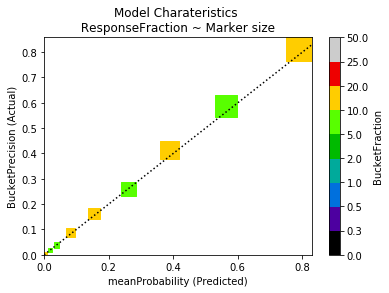

In [26]:
model_parameters = {'MLAlgorithm':'LGR', # 'RF', # 'DFF', # 'CNN', # 'CATBST', # 'XGBST'
                    'MaxIterations':50}  

LGRModel = mltk.build_ml_model(TrainDataset, ValidateDataset, TestDataset, model_variables, class_variable, 
                 model_attributes, sample_attributes, model_parameters, score_parameters, 
                          return_model_object=True, show_results=False, show_plot=True)

In [27]:
LGRModel.model_attributes['ModelID']

'INCOMELEVELLGR20190701013951'

In [28]:
LGRModel.model_interpretation['ModelSummary']

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                19536
Model:                          Logit   Df Residuals:                    19486
Method:                           MLE   Df Model:                           49
Date:                Mon, 01 Jul 2019   Pseudo R-squ.:                  0.3762
Time:                        01:39:55   Log-Likelihood:                -6719.9
converged:                      False   LL-Null:                       -10773.
                                        LLR p-value:                     0.000
========================================================================================================
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
workclass_Federal-gov                    0.7918      0.189      4.197      0.000       0.422       1.161
workclass_Local-gov                     -0.0399      0.170     -0.235      0.814      -0.372       0.293
workclass_Never-worked                 -11.6801    840.642     -0.014      0.989   -1659.307    1635.947
workclass_Private                        0.2161      0.150      1.442      0.149      -0.078       0.510
workclass_Self-emp-inc                   0.5378      0.177      3.033      0.002       0.190       0.885
workclass_Self-emp-not-inc              -0.1691      0.163     -1.037      0.300      -0.489       0.151
workclass_State-gov                     -0.0497      0.185     -0.269      0.788      -0.412       0.312
marital-status_Divorced                 -0.2891      0.170     -1.701      0.089      -0.622       0.044
marital-status_Married-AF-spouse         2.7713      0.619      4.477      0.000       1.558       3.984
marital-status_Married-civ-spouse        2.0026      0.184     10.888      0.000       1.642       2.363
marital-status_Married-spouse-absent    -0.4831      0.311     -1.555      0.120      -1.092       0.126
marital-status_Never-married            -0.5366      0.173     -3.098      0.002      -0.876      -0.197
marital-status_Separated                -0.4483      0.242     -1.849      0.064      -0.924       0.027
occupation_Adm-clerical                  0.1199      0.123      0.977      0.328      -0.121       0.360
occupation_Armed-Forces                -21.8774   9.65e+04     -0.000      1.000   -1.89e+05    1.89e+05
occupation_Craft-repair                  0.1484      0.106      1.403      0.161      -0.059       0.356
occupation_Exec-managerial               0.9790      0.107      9.155      0.000       0.769       1.189
occupation_Farming-fishing              -0.7261      0.171     -4.255      0.000      -1.061      -0.392
occupation_Handlers-cleaners            -0.6321      0.190     -3.334      0.001      -1.004      -0.261
occupation_Machine-op-inspct            -0.2965      0.134     -2.207      0.027      -0.560      -0.033
occupation_Other-service                -0.7733      0.156     -4.967      0.000      -1.078      -0.468
occupation_Priv-house-serv             -23.3303    5.1e+04     -0.000      1.000      -1e+05    9.99e+04
occupation_Prof-specialty                0.8003      0.114      6.991      0.000       0.576       1.025
occupation_Protective-serv               0.5881      0.163      3.612      0.000       0.269       0.907
occupation_Sales                         0.5485      0.111      4.943      0.000       0.331       0.766
occupation_Tech-support                  0.6240      0.148      4.210      0.000       0.333       0.914
relationship_Husband                    -1.2623      0.117    -10.783      0.000      -1.492      -1.033
relationship_Not-in-family              -0.5913      0.195     -3.034      0.002      -0.97

In [29]:
LGRModel.model_evaluation['AUC']

0.8895831759393703

In [30]:
LGRModel.model_evaluation['RobustnessTable']

,minProbability,maxProbability,meanProbability,BucketCount,ResponseCount,BucketFraction,ResponseFraction,BucketPrecision,CumulativeBucketFraction,CumulativeResponseFraction,CumulativePrecision
Quantile,,,,,,,,,,,
1,9.21155e-33,0.00272,0.00041,652,4,0.10011,0.00256,0.00613,1.00000,1.00000,0.23967
2,2.72982e-03,0.01075,0.00643,652,4,0.10011,0.00256,0.00613,0.89989,0.99744,0.26565
3,1.07880e-02,0.02500,0.01746,650,13,0.09980,0.00833,0.02000,0.79979,0.99488,0.29814
4,2.50004e-02,0.05585,0.03878,651,25,0.09995,0.01602,0.03840,0.69998,0.98655,0.33779
5,5.59187e-02,0.11454,0.08193,655,58,0.10057,0.03716,0.08855,0.60003,0.97053,0.38767
6,1.14709e-01,0.20391,0.15529,661,108,0.10149,0.06919,0.16339,0.49946,0.93338,0.44789
7,2.04033e-01,0.31519,0.26115,639,166,0.09811,0.10634,0.25978,0.39797,0.86419,0.52045
8,3.15223e-01,0.46869,0.38952,657,272,0.10088,0.17425,0.41400,0.29986,0.75785,0.60573
9,4.68758e-01,0.67284,0.56236,644,378,0.09888,0.24215,0.58696,0.19899,0.58360,0.70293


In [31]:
mltk.save_object(LGRModel, '{}.pkl'.format(LGRModel.get_model_id()))

Saving model to file INCOMELEVELLGR20190701013951.pkl


## 6.2 Random Forest Classifier

Train samples: 19536 loded...
Validate samples: 6512 loded...
Test samples: 6513 loded...
{'ModelID': 'INCOMELEVELRF20190701013956', 'ModelName': 'IncomeLevel', 'Version': '19.1', 'BuiltTime': '20190701013956', 'ModelFitTime': -1, 'MLTool': 'statsmodels=0.9.0'}
{'MLAlgorithm': 'RF', 'NTrees': 500, 'MaxDepth': 50, 'MinSamplesToSplit': 20, 'Processors': 2}
{'SampleDescription': 'FSC Hosted Clients Dupe Claims 2016-2018', 'NumClasses': 2, 'RecordIdentifiers': ['SourceDB', 'UniqueClaimId', 'DupeRpt'], 'TrainSize': 19536, 'ValidateSize': 6512, 'TestSize': 6513, 'TrainValidateTestRatio': '[0.6 0.2 0.2]', 'TrainResponseRate': 0.24032555282555282, 'ValidateResponseRate': 0.2433968058968059, 'TestResponseRate': 0.2396744971595271}
{'Edges': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], 'Quantiles': 10, 'ScoreVariable': 'Probability', 'ScoreLabel': 'IncomeScore', 'QuantileLabel': 'Quantile'}


[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    2.4s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    5.5s
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    6.1s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    0.4s finished


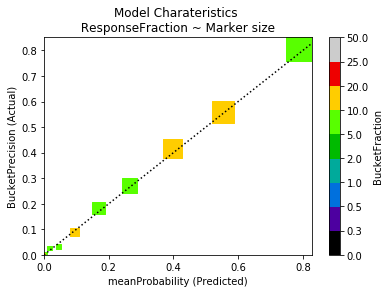

In [32]:
model_parameters = {'MLAlgorithm':'RF', # 'LGR', #  'DFF', # 'CNN', # 'CATBST', # 'XGBST'
                    'NTrees':500,
                   'MaxDepth':50,
                   'MinSamplesToSplit':20,
                   'Processors':2} 

RFModel = mltk.build_ml_model(TrainDataset, ValidateDataset, TestDataset, model_variables, class_variable, 
                 model_attributes, sample_attributes, model_parameters, score_parameters, 
                          return_model_object=True, show_results=False, show_plot=True)

In [33]:
RFModel.model_attributes['ModelID']

'INCOMELEVELRF20190701013956'

In [34]:
RFModel.model_interpretation['ModelSummary']

,Features,Importances,stdev
9,marital-status_Married-civ-spouse,1.69450e-01,0.14155
26,relationship_Husband,9.61645e-02,0.11729
16,occupation_Exec-managerial,5.84938e-02,0.02193
22,occupation_Prof-specialty,5.66891e-02,0.02077
11,marital-status_Never-married,5.57733e-02,0.07635
44,"education-numGRP_4_[8,10]",4.13961e-02,0.01260
37,"ageGRP_2_[20,30]",3.73802e-02,0.02209
45,"education-numGRP_5_[10,13]",3.32156e-02,0.01500
35,sex_Female,2.62779e-02,0.02927
29,relationship_Own-child,2.49525e-02,0.03898


In [35]:
RFModel.model_evaluation['AUC']

0.885251262860165

In [36]:
RFModel.model_evaluation['RobustnessTable']

,minProbability,maxProbability,meanProbability,BucketCount,ResponseCount,BucketFraction,ResponseFraction,BucketPrecision,CumulativeBucketFraction,CumulativeResponseFraction,CumulativePrecision
Quantile,,,,,,,,,,,
1,0.00000,0.00080,0.00010,659,2,0.10118,0.00128,0.00303,1.00000,1.00000,0.23967
2,0.00081,0.00851,0.00373,648,5,0.09949,0.00320,0.00772,0.89882,0.99872,0.26631
3,0.00853,0.02807,0.01720,647,17,0.09934,0.01089,0.02628,0.79932,0.99552,0.29850
4,0.02812,0.06516,0.04411,651,21,0.09995,0.01345,0.03226,0.69998,0.98463,0.33714
5,0.06518,0.12304,0.09312,652,58,0.10011,0.03716,0.08896,0.60003,0.97117,0.38792
6,0.12329,0.21025,0.16803,651,119,0.09995,0.07623,0.18280,0.49992,0.93402,0.44779
7,0.21042,0.31732,0.26328,651,177,0.09995,0.11339,0.27189,0.39997,0.85778,0.51401
8,0.31775,0.46270,0.39809,652,272,0.10011,0.17425,0.41718,0.30002,0.74439,0.59468
9,0.46298,0.66027,0.55420,657,367,0.10088,0.23511,0.55860,0.19991,0.57015,0.68356


In [37]:
mltk.save_object(RFModel, '{}.pkl'.format(RFModel.get_model_id()))

Saving model to file INCOMELEVELRF20190701013956.pkl


###  Forest Model 2

Train samples: 19536 loded...
Validate samples: 6512 loded...
Test samples: 6513 loded...
{'ModelID': 'INCOMELEVELRF20190701014006', 'ModelName': 'IncomeLevel', 'Version': '19.1', 'BuiltTime': '20190701014006', 'ModelFitTime': -1, 'MLTool': 'sklearn=0.21.1'}
{'MLAlgorithm': 'RF', 'NTrees': 1000, 'MaxDepth': 100, 'MinSamplesToSplit': 20, 'Processors': 2}
{'SampleDescription': 'FSC Hosted Clients Dupe Claims 2016-2018', 'NumClasses': 2, 'RecordIdentifiers': ['SourceDB', 'UniqueClaimId', 'DupeRpt'], 'TrainSize': 19536, 'ValidateSize': 6512, 'TestSize': 6513, 'TrainValidateTestRatio': '[0.6 0.2 0.2]', 'TrainResponseRate': 0.24032555282555282, 'ValidateResponseRate': 0.2433968058968059, 'TestResponseRate': 0.2396744971595271}
{'Edges': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], 'Quantiles': 10, 'ScoreVariable': 'Probability', 'ScoreLabel': 'IncomeScore', 'QuantileLabel': 'Quantile'}


[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    1.9s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    4.7s
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:    9.2s
[Parallel(n_jobs=2)]: Done 1000 out of 1000 | elapsed:   11.5s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.4s
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:    0.7s
[Parallel(n_jobs=2)]: Done 1000 out of 1000 | elapsed:    1.0s finished


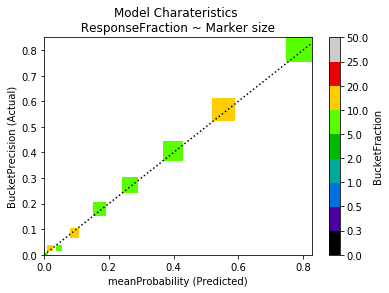

In [38]:
model_parameters = {'MLAlgorithm':'RF', # 'LGR', #  'DFF', # 'CNN', # 'CATBST', # 'XGBST'
                    'NTrees':1000,
                   'MaxDepth':100,
                   'MinSamplesToSplit':20,
                   'Processors':2} 

RFModel2 = mltk.build_ml_model(TrainDataset, ValidateDataset, TestDataset, model_variables, class_variable, 
                 model_attributes, sample_attributes, model_parameters, score_parameters, 
                          return_model_object=True, show_results=False, show_plot=True)

In [39]:
RFModel2.model_attributes['ModelID']

'INCOMELEVELRF20190701014006'

In [40]:
RFModel2.model_interpretation['ModelSummary']

,Features,Importances,stdev
9,marital-status_Married-civ-spouse,1.69256e-01,0.13900
26,relationship_Husband,1.02204e-01,0.12037
16,occupation_Exec-managerial,5.93830e-02,0.02331
22,occupation_Prof-specialty,5.83374e-02,0.02047
11,marital-status_Never-married,5.42794e-02,0.07591
44,"education-numGRP_4_[8,10]",4.07250e-02,0.01300
37,"ageGRP_2_[20,30]",3.73260e-02,0.02177
45,"education-numGRP_5_[10,13]",3.39133e-02,0.01529
35,sex_Female,2.39895e-02,0.02665
29,relationship_Own-child,2.31881e-02,0.03646


In [41]:
RFModel2.model_evaluation['AUC']

0.8851455717359424

In [42]:
RFModel2.model_evaluation['RobustnessTable']

,minProbability,maxProbability,meanProbability,BucketCount,ResponseCount,BucketFraction,ResponseFraction,BucketPrecision,CumulativeBucketFraction,CumulativeResponseFraction,CumulativePrecision
Quantile,,,,,,,,,,,
1,0.00000,0.00068,0.00010,660,2,0.10134,0.00128,0.00303,1.00000,1.00000,0.23967
2,0.00068,0.00834,0.00365,643,5,0.09873,0.00320,0.00778,0.89866,0.99872,0.26636
3,0.00837,0.02880,0.01706,652,19,0.10011,0.01217,0.02914,0.79994,0.99552,0.29827
4,0.02881,0.06601,0.04459,650,19,0.09980,0.01217,0.02923,0.69983,0.98334,0.33677
5,0.06607,0.12219,0.09303,652,57,0.10011,0.03652,0.08742,0.60003,0.97117,0.38792
6,0.12244,0.21052,0.16936,651,118,0.09995,0.07559,0.18126,0.49992,0.93466,0.44810
7,0.21179,0.32056,0.26413,651,178,0.09995,0.11403,0.27343,0.39997,0.85906,0.51478
8,0.32062,0.46321,0.39686,651,266,0.09995,0.17040,0.40860,0.30002,0.74504,0.59519
9,0.46365,0.65910,0.55404,657,374,0.10088,0.23959,0.56925,0.20006,0.57463,0.68841


## Model Comparison

## ROC Curve
### True Positive Rate (TPR) vs.False Positive Rate (FPR)
#### References
* T. Fawcett, An introduction to ROC analysis, Pattern Recognition Letters, Volume 27, Issue 8, June 2006, Pages 861-874. doi.org/10.1016/j.patrec.2005.10.010. 
* sklearn.metrics.roc_curve, http://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html

In [43]:
%matplotlib auto
#%matplotlib notebook

Using matplotlib backend: Qt5Agg


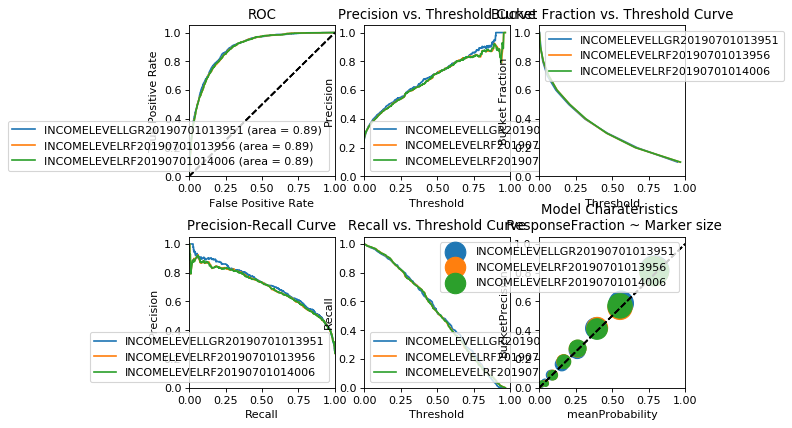

In [44]:
LGRModel.plot_eval_matrics(comparison=True)
RFModel.plot_eval_matrics(comparison=True)
RFModel2.plot_eval_matrics(comparison=True)

# 7. Score

In [45]:
TestDataset = mltk.score_dataset(TestDataset, RFModel, edges=None, score_label=None, fill_missing=0)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    0.3s finished


In [46]:
%matplotlib inline

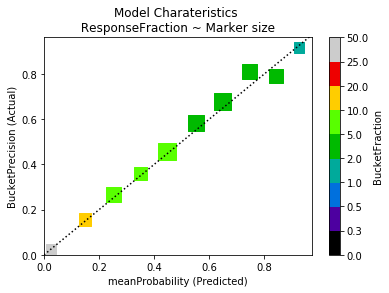

In [47]:
score_variable = RFModel.get_score_variable()
score_label = RFModel.get_score_label()
Robustnesstable = mltk.robustness_table(ResultsSet=TestDataset, class_variable=class_variable, score_variable=score_variable,  score_label=score_label, show_plot=True)

## Generate Predicted Value (Score)

## Confusion Matrix [actual, predicted]

### Confusion Matrix Terms
#### For a Binary Classifier
* TN= CF[0,0], FP= CF[0,1], FN= CF[1,0], TP= CF[1,1]
* Accuracy (ACC) = (TP+TN)/TOTAL
* Hit Rate, Sensitivity, Recall or True Positive Rate (TPR) = TP/(TP+FN)
* False Positive Rate (FPR) = FP/(FP+TN) 
* Specificity or True Negative Rate (TNR) = TN/(FP+TN)
* Miss Rate or False Negative rate (FNR) = FN/(FN+TP) 
* Positive Predictive Value or Precision (PPV) = TP/(TP+FP) 
* Harmonic Mean of Precision and Sensitivity or F1 score (F1) = 2TP/(2TP+FP+FN)

#### For a Multi-class Classifier
* TPS = Diagonal(CF)
* SUCCESS = Sum(TPS)
* Sum of Actual Conditions (ASUM) = RowSum(CF)
* Sum of Predicted conditions (PSUM) = ColumnsSum(CF)
* Positive Predictive Value or Precision for Class i (PPV[i]) = TPS[i]/PSUM
* Hit Rate, Sensitivity, Recall or True Positive Rate for Class i (TPR[i]) = TPS[i]/ASUM

##### References: 
* C. Beleites, R. Salzer, V. Sergo, Validation of soft classification models using partial class memberships: An extended concept of sensitivity & co. applied to grading of astrocytoma tissues, Chemometrics and Intelligent Laboratory Systems Volume 122, 15 March 2013, Pages 12-22. doi.org/10.1016/j.chemolab.2012.12.003.
* sklearn.metrics.confusion_matrix, http://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html
* Confusion Matrix, http://www2.cs.uregina.ca/~dbd/cs831/notes/ROC/ROC.html.




In [48]:
threshold = 0.7
TestDataset['Predicted'] = np.where(TestDataset[score_variable]>threshold,1,0)
ConfusionMatrix = mltk.confusion_matrix(actual_variable=TestDataset[class_variable], predcted_variable=TestDataset['Predicted'], labels=[0,1], sample_weight=None, totals=True)
ConfusionMatrix.style.background_gradient(cmap='coolwarm').set_precision(3)

In [49]:
threshold = 0.8
TestDataset['Predicted'] = np.where(TestDataset[score_variable]>threshold,1,0)
ConfusionMatrix = mltk.confusion_matrix(actual_variable=TestDataset[class_variable], predcted_variable=TestDataset['Predicted'], labels=[0,1], sample_weight=None, totals=True)
ConfusionMatrix.style.background_gradient(cmap='coolwarm').set_precision(3)

In [50]:
ConfusionMatrixRow = mltk.confusion_matrix_to_row(ConfusionMatrix, ModelID=RFModel.model_attributes['ModelID'])
ConfusionMatrixRow 

,ModelID,TN,FP,FN,TP,TOTAL,P1,P0,A1,A0,TPR,TNR,FPR,FNR,PPV,ACC,F1
0,INCOMELEVELRF20190701013956,4903,49,1317,244,6513,293,6220,1561,4952,0.15631,0.99011,0.00989,0.84369,0.83276,0.79027,0.26321


In [51]:
Models = [LGRModel, RFModel, RFModel2]
threshold=0.8
ConfusionMatrixComparison = mltk.confusion_matrix_comparison(TestDataset, Models, score_variable, threshold)
ConfusionMatrixComparison.style.background_gradient(cmap='coolwarm').set_precision(3)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done 1000 out of 1000 | elapsed:    0.7s finished


,ModelID,TN,FP,FN,TP,TOTAL,P1,P0,A1,A0,TPR,TNR,FPR,FNR,PPV,ACC,F1
0,INCOMELEVELLGR20190701013951_0.8,4921,31,1304,257,6513,288,6225,1561,4952,0.165,0.994,0.00626,0.835,0.892,0.795,0.278
1,INCOMELEVELRF20190701013956_0.8,4903,49,1317,244,6513,293,6220,1561,4952,0.156,0.99,0.00989,0.844,0.833,0.79,0.263
2,INCOMELEVELRF20190701014006_0.8,4912,40,1330,231,6513,271,6242,1561,4952,0.148,0.992,0.00808,0.852,0.852,0.79,0.252


<hr>

This notebook and related materials were developed by Sumudu Tennakoon to demostrate the MLToolkit python library and its interoperability with the standared Python data analysis and machine learning packages (e.g. Pandas, Sci-kitlearn, Statsmodel, etc.)
Create Date: July 01, 2018; Last Update: July 01, 2019. 
Apache License, Version 2.0 (http://www.apache.org/licenses/LICENSE-2.0)